In [1]:
import numexpr as ne 
import lsdb

 # pick a sensible value
print(ne.detect_number_of_cores())
print(ne.get_num_threads())
import matplotlib.pyplot as plt
from matplotlib import rcParams
from tqdm import tqdm
from pathlib import Path
import pandas as pd
import textwrap
from dask.distributed import Client
import warnings
from astropy.coordinates import SkyCoord
import numpy as np
import astropy.units as u
import matplotlib as mpl
import dask
from lsdb.core.search import ConeSearch

# Configuration settings
warnings.simplefilter("ignore")
logging.getLogger("numexpr.utils").setLevel(logging.WARNING)
logging.getLogger("distributed").setLevel(logging.WARNING)
rcParams["savefig.dpi"] = 550
rcParams["font.size"] = 20
plt.rc("font", family="serif")
mpl.rcParams["axes.linewidth"] = 2
dask.config.set({"dataframe.convert-string": False})

print(f"Version of lsdb is {lsdb.__version__}")



INFO:numexpr.utils:Note: detected 128 virtual cores but NumExpr set to maximum of 64, check "NUMEXPR_MAX_THREADS" environment variable.
INFO:numexpr.utils:Note: NumExpr detected 128 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 16.
INFO:numexpr.utils:NumExpr defaulting to 16 threads.


128
16
Version of lsdb is 0.6.4


In [2]:
client = Client(n_workers=64, memory_limit="250GiB", threads_per_worker=2)
# Print the dashboard link and port
print(f"Dask is running at: {client.dashboard_link}")

Dask is running at: http://127.0.0.1:8787/status


In [55]:
# PPDB - load the small portion
hats_dir_ppdb = Path("/sdf/data/rubin/shared/lsdb_commissioning/hats/PPDB")
cone_search = ConeSearch(ra=220, dec=-40, radius_arcsec=7 * 3600)

dia_object_cat_PPDB = lsdb.open_catalog(hats_dir_ppdb / "diaobject_cat_test", search_filter=cone_search, columns=["diaObjectId", "ra", "dec"])
dia_source_cat_PPDB = lsdb.open_catalog(hats_dir_ppdb / "diasource_cat_test", search_filter=cone_search, columns = ["diaObjectId", 'diaSourceId', 'ssObjectId', 
                                                                                                               'midpointMjdTai', "ra", "dec"])
dia_object_cat_nested_PPDB = lsdb.open_catalog(hats_dir_ppdb / "dia_object_lc", search_filter=cone_search)

"""
dia_object_cat_PPDB = lsdb.open_catalog(hats_dir_ppdb / "diaobject_cat_test", columns=["diaObjectId", "ra", "dec"])
dia_source_cat_PPDB = lsdb.open_catalog(hats_dir_ppdb / "diasource_cat_test",  columns = ["diaObjectId", 'diaSourceId', 'ssObjectId', 
                                                                                                               'midpointMjdTai', "ra", "dec"])
dia_object_cat_nested_PPDB = lsdb.open_catalog(hats_dir_ppdb / "dia_object_lc", columns=["diaObjectId",  "ra", "dec", "diaSource"])
"""

'\ndia_object_cat_PPDB = lsdb.open_catalog(hats_dir_ppdb / "diaobject_cat_test", columns=["diaObjectId", "ra", "dec"])\ndia_source_cat_PPDB = lsdb.open_catalog(hats_dir_ppdb / "diasource_cat_test",  columns = ["diaObjectId", \'diaSourceId\', \'ssObjectId\', \n                                                                                                               \'midpointMjdTai\', "ra", "dec"])\ndia_object_cat_nested_PPDB = lsdb.open_catalog(hats_dir_ppdb / "dia_object_lc", columns=["diaObjectId",  "ra", "dec", "diaSource"])\n'

In [ ]:
# checking the time selection 
col_time = [col for col in dia_object_cat_nested_PPDB.per_pixel_statistics().columns 
 if "midpointMjdTai" in col]
dia_object_cat_nested_PPDB.per_pixel_statistics()[col_time]

,diaSource.midpointMjdTai: min_value,diaSource.midpointMjdTai: max_value,diaSource.midpointMjdTai: null_count,diaSource.midpointMjdTai: row_count
"Order: 6, Pixel: 41983",60816.275567,60873.162013,0,6373
"Order: 7, Pixel: 170659",60816.275567,60873.152644,0,2284
...,...,...,...,...
"Order: 4, Pixel: 2753",60816.273809,60873.153101,0,567253
"Order: 5, Pixel: 11016",60816.276056,60873.152184,0,281157


In [ ]:
# ok, lets see what time is covered by PPDB
print(np.min(dia_object_cat_nested_PPDB.per_pixel_statistics()['diaSource.midpointMjdTai: min_value']))
print(np.max(dia_object_cat_nested_PPDB.per_pixel_statistics()['diaSource.midpointMjdTai: max_value']))

60816.27380867624
60873.16795061381


In [3]:
# HATS 
# pull weekly 30, get the same small portion of the sky
hats_dir_dm = Path("/sdf/data/rubin/shared/lsdb_commissioning/hats/w_2025_30")
cone_search = ConeSearch(ra=220, dec=-40, radius_arcsec=7 * 3600)

"""
object_cat = lsdb.open_catalog(hats_dir_dm / "object_collection", columns=["objectId", "coord_ra", "coord_dec"])
dia_object_cat = lsdb.open_catalog(hats_dir_dm / "dia_object_collection", columns=["diaObjectId", "ra", "dec", 'diaObjectForcedSource'])
"""

object_cat = lsdb.open_catalog(hats_dir_dm / "object_collection", search_filter=cone_search, columns=["objectId", "coord_ra", "coord_dec"])
dia_object_cat = lsdb.open_catalog(hats_dir_dm / "dia_object_collection", search_filter=cone_search)


In [ ]:
fov = (10 * u.deg, 10 * u.deg)
center = SkyCoord(225 * u.deg, -40 * u.deg)

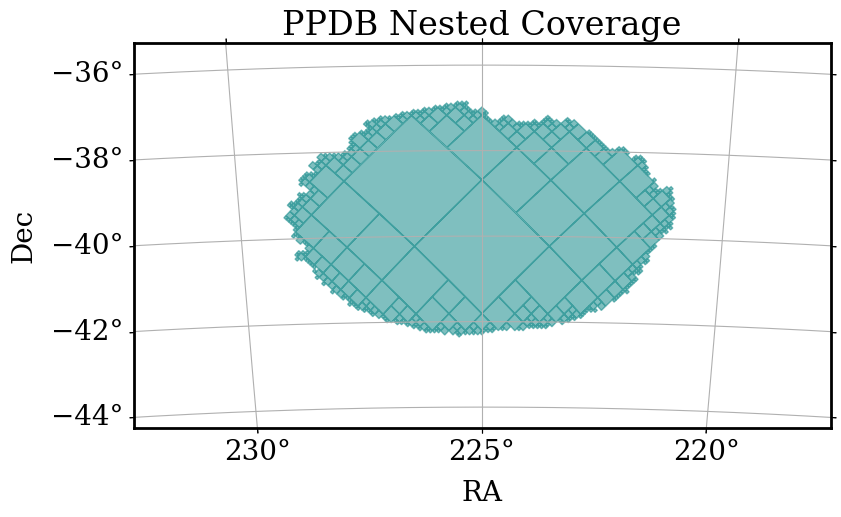

In [61]:
fig, ax = dia_object_cat_nested_PPDB.plot_coverage(
    fov=fov,
    center=center,
    title="PPDB Nested Coverage"
)

(<Figure size 900x500 with 1 Axes>,
 <WCSAxes: title={'center': 'Coverage MOC of dia_object_lc'}>)

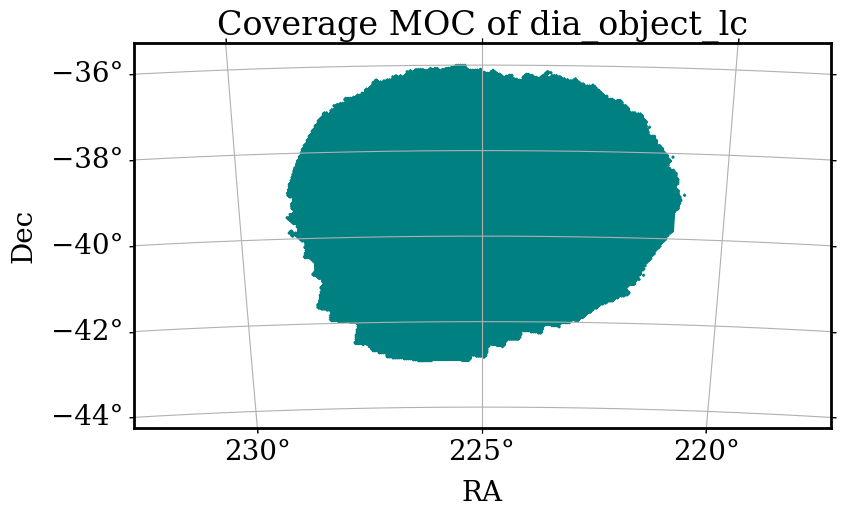

In [60]:
dia_object_cat.plot_coverage(fov=fov, center=center, alpha=1)


# X-match of DM and PPDB

In [62]:
dia_object_cat['diaObjectForcedSource'].nest.fields

['band',
 'coord_dec',
 'coord_ra',
 'diff_PixelFlags_nodataCenter',
 'forcedSourceOnDiaObjectId',
 'invalidPsfFlag',
 'midpointMjdTai',
 'pixelFlags_bad',
 'pixelFlags_cr',
 'pixelFlags_crCenter',
 'pixelFlags_edge',
 'pixelFlags_interpolated',
 'pixelFlags_interpolatedCenter',
 'pixelFlags_nodata',
 'pixelFlags_saturated',
 'pixelFlags_saturatedCenter',
 'pixelFlags_suspect',
 'pixelFlags_suspectCenter',
 'psfDiffFlux',
 'psfDiffFlux_flag',
 'psfDiffFluxErr',
 'psfFlux',
 'psfFlux_flag',
 'psfFluxErr',
 'psfMag',
 'psfMagErr',
 'visit']

In [ ]:
dia_object_cat_time = (
    dia_object_cat
      .query("diaObjectForcedSource.midpointMjdTai > 60816.27")
      .query("diaSource.midpointMjdTai > 60816.27")
)

In [13]:
PPSB_DM_match = lsdb.crossmatch(dia_object_cat_nested_PPDB, dia_object_cat_time, suffixes =("_ppdb", "_dm"))

In [14]:
PPSB_DM_match

,diaObjectId_ppdb,validityStart_ppdb,dec_ppdb,decErr_ppdb,g_fpFluxMean_ppdb,g_fpFluxMeanErr_ppdb,g_fpFluxSigma_ppdb,g_psfFluxChi2_ppdb,g_psfFluxErrMean_ppdb,g_psfFluxLinearIntercept_ppdb,g_psfFluxLinearSlope_ppdb,g_psfFluxMAD_ppdb,g_psfFluxMax_ppdb,g_psfFluxMaxSlope_ppdb,g_psfFluxMean_ppdb,g_psfFluxMeanErr_ppdb,g_psfFluxMin_ppdb,g_psfFluxNdata_ppdb,g_psfFluxPercentile05_ppdb,g_psfFluxPercentile25_ppdb,g_psfFluxPercentile50_ppdb,g_psfFluxPercentile75_ppdb,g_psfFluxPercentile95_ppdb,g_psfFluxSigma_ppdb,g_psfFluxSkew_ppdb,g_psfFluxStetsonJ_ppdb,g_scienceFluxMean_ppdb,g_scienceFluxMeanErr_ppdb,g_scienceFluxSigma_ppdb,i_fpFluxMean_ppdb,i_fpFluxMeanErr_ppdb,i_fpFluxSigma_ppdb,i_psfFluxChi2_ppdb,i_psfFluxErrMean_ppdb,i_psfFluxLinearIntercept_ppdb,i_psfFluxLinearSlope_ppdb,i_psfFluxMAD_ppdb,i_psfFluxMax_ppdb,i_psfFluxMaxSlope_ppdb,i_psfFluxMean_ppdb,i_psfFluxMeanErr_ppdb,i_psfFluxMin_ppdb,i_psfFluxNdata_ppdb,i_psfFluxPercentile05_ppdb,i_psfFluxPercentile25_ppdb,i_psfFluxPercentile50_ppdb,i_psfFluxPercentile75_ppdb,i_psfFluxPercentile95_ppdb,i_psfFluxSigma_ppdb,i_psfFluxSkew_ppdb,i_psfFluxStetsonJ_ppdb,i_scienceFluxMean_ppdb,i_scienceFluxMeanErr_ppdb,i_scienceFluxSigma_ppdb,lastNonForcedSource_ppdb,nDiaSources_ppdb,nearbyExtObj1_ppdb,nearbyExtObj1Sep_ppdb,nearbyExtObj2_ppdb,nearbyExtObj2Sep_ppdb,nearbyExtObj3_ppdb,nearbyExtObj3Sep_ppdb,nearbyLowzGal_ppdb,nearbyLowzGalSep_ppdb,nearbyObj1_ppdb,nearbyObj1Dist_ppdb,nearbyObj1LnP_ppdb,nearbyObj2_ppdb,nearbyObj2Dist_ppdb,nearbyObj2LnP_ppdb,nearbyObj3_ppdb,nearbyObj3Dist_ppdb,nearbyObj3LnP_ppdb,parallax_ppdb,parallaxErr_ppdb,pmDec_ppdb,pmDecErr_ppdb,pmDec_parallax_Cov_ppdb,pmParallaxChi2_ppdb,pmParallaxLnL_ppdb,pmParallaxNdata_ppdb,pmRa_ppdb,pmRaErr_ppdb,pmRa_parallax_Cov_ppdb,pmRa_pmDec_Cov_ppdb,r_fpFluxMean_ppdb,r_fpFluxMeanErr_ppdb,r_fpFluxSigma_ppdb,r_psfFluxChi2_ppdb,r_psfFluxErrMean_ppdb,r_psfFluxLinearIntercept_ppdb,r_psfFluxLinearSlope_ppdb,r_psfFluxMAD_ppdb,r_psfFluxMax_ppdb,r_psfFluxMaxSlope_ppdb,r_psfFluxMean_ppdb,r_psfFluxMeanErr_ppdb,r_psfFluxMin_ppdb,r_psfFluxNdata_ppdb,r_psfFluxPercentile05_ppdb,r_psfFluxPercentile25_ppdb,r_psfFluxPercentile50_ppdb,r_psfFluxPercentile75_ppdb,r_psfFluxPercentile95_ppdb,r_psfFluxSigma_ppdb,r_psfFluxSkew_ppdb,r_psfFluxStetsonJ_ppdb,r_scienceFluxMean_ppdb,r_scienceFluxMeanErr_ppdb,r_scienceFluxSigma_ppdb,ra_ppdb,raErr_ppdb,ra_dec_Cov_ppdb,radecMjdTai_ppdb,u_fpFluxMean_ppdb,u_fpFluxMeanErr_ppdb,u_fpFluxSigma_ppdb,u_psfFluxChi2_ppdb,u_psfFluxErrMean_ppdb,u_psfFluxLinearIntercept_ppdb,u_psfFluxLinearSlope_ppdb,u_psfFluxMAD_ppdb,u_psfFluxMax_ppdb,u_psfFluxMaxSlope_ppdb,u_psfFluxMean_ppdb,u_psfFluxMeanErr_ppdb,u_psfFluxMin_ppdb,u_psfFluxNdata_ppdb,u_psfFluxPercentile05_ppdb,u_psfFluxPercentile25_ppdb,u_psfFluxPercentile50_ppdb,u_psfFluxPercentile75_ppdb,u_psfFluxPercentile95_ppdb,u_psfFluxSigma_ppdb,u_psfFluxSkew_ppdb,u_psfFluxStetsonJ_ppdb,u_scienceFluxMean_ppdb,u_scienceFluxMeanErr_ppdb,u_scienceFluxSigma_ppdb,validityEnd_ppdb,y_fpFluxMean_ppdb,y_fpFluxMeanErr_ppdb,y_fpFluxSigma_ppdb,y_psfFluxChi2_ppdb,y_psfFluxErrMean_ppdb,y_psfFluxLinearIntercept_ppdb,y_psfFluxLinearSlope_ppdb,y_psfFluxMAD_ppdb,y_psfFluxMax_ppdb,y_psfFluxMaxSlope_ppdb,y_psfFluxMean_ppdb,y_psfFluxMeanErr_ppdb,y_psfFluxMin_ppdb,y_psfFluxNdata_ppdb,y_psfFluxPercentile05_ppdb,y_psfFluxPercentile25_ppdb,y_psfFluxPercentile50_ppdb,y_psfFluxPercentile75_ppdb,y_psfFluxPercentile95_ppdb,y_psfFluxSigma_ppdb,y_psfFluxSkew_ppdb,y_psfFluxStetsonJ_ppdb,y_scienceFluxMean_ppdb,y_scienceFluxMeanErr_ppdb,y_scienceFluxSigma_ppdb,z_fpFluxMean_ppdb,z_fpFluxMeanErr_ppdb,z_fpFluxSigma_ppdb,z_psfFluxChi2_ppdb,z_psfFluxErrMean_ppdb,z_psfFluxLinearIntercept_ppdb,z_psfFluxLinearSlope_ppdb,z_psfFluxMAD_ppdb,z_psfFluxMax_ppdb,z_psfFluxMaxSlope_ppdb,z_psfFluxMean_ppdb,z_psfFluxMeanErr_ppdb,z_psfFluxMin_ppdb,z_psfFluxNdata_ppdb,z_psfFluxPercentile05_ppdb,z_psfFluxPercentile25_ppdb,z_psfFluxPercentile50_ppdb,z_psfFluxPercentile75_ppdb,z_psfFluxPercentile95_ppdb,z_psfFluxSigma_ppdb,z_psfFluxSkew_ppdb,z_psfFluxStets

In [ ]:
# PPSB_DM_match.to_hats(hats_dir_ppdb / "ppdb_dm_match", catalog_name="ppdb_dm_match", overwrite=True)

# Visualize single lc

In [ ]:
PPSB_DM_match = lsdb.open_catalog(hats_dir_ppdb / "ppdb_dm_match")


In [39]:
len(PPSB_DM_match)

3622985

In [18]:
PPSB_DM_match_small = PPSB_DM_match.head(6)

In [ ]:
PPSB_DM_match_small.columns

Index(['diaObjectId_ppdb', 'validityStart_ppdb', 'dec_ppdb', 'decErr_ppdb',
       'g_fpFluxMean_ppdb', 'g_fpFluxMeanErr_ppdb', 'g_fpFluxSigma_ppdb',
       'g_psfFluxChi2_ppdb', 'g_psfFluxErrMean_ppdb',
       'g_psfFluxLinearIntercept_ppdb',
       ...
       'diaSource_ppdb', 'dec_dm', 'diaObjectId_dm', 'nDiaSources_dm', 'ra_dm',
       'radecMjdTai_dm', 'tract_dm', 'diaObjectForcedSource_dm',
       'diaSource_dm', '_dist_arcsec'],
      dtype='object', length=200)

In [ ]:
single_object = PPSB_DM_match_small[['ra_ppdb','dec_ppdb','ra_dm','dec_dm', 'diaSource_ppdb','diaObjectForcedSource_dm','diaSource_dm']].iloc[3]

In [ ]:
pd.set_option("display.max_columns", None) 
single_object['diaSource_ppdb']

,diaSourceId,apFlux,apFluxErr,apFlux_flag,apFlux_flag_apertureTruncated,band,bboxSize,centroid_flag,dec,decErr,detector,dipoleAngle,dipoleAngleErr,dipoleChi2,dipoleDec,dipoleDecErr,dipoleDec_dipoleAngle_Cov,dipoleDec_dipoleLength_Cov,dipoleFitAttempted,dipoleFluxDiff,dipoleFluxDiffErr,dipoleFluxDiff_dipoleAngle_Cov,dipoleFluxDiff_dipoleDec_Cov,dipoleFluxDiff_dipoleLength_Cov,dipoleFluxDiff_dipoleRa_Cov,dipoleLength,dipoleLengthErr,dipoleLength_dipoleAngle_Cov,dipoleLnL,dipoleMeanFlux,dipoleMeanFluxErr,dipoleMeanFlux_dipoleAngle_Cov,dipoleMeanFlux_dipoleDec_Cov,dipoleMeanFlux_dipoleFluxDiff_Cov,dipoleMeanFlux_dipoleLength_Cov,dipoleMeanFlux_dipoleRa_Cov,dipoleNdata,dipoleRa,dipoleRaErr,dipoleRa_dipoleAngle_Cov,dipoleRa_dipoleDec_Cov,dipoleRa_dipoleLength_Cov,extendedness,forced_PsfFlux_flag,forced_PsfFlux_flag_edge,forced_PsfFlux_flag_noGoodPixels,fpBkgd,fpBkgdErr,isDipole,is_negative,ixx,ixxErr,ixxPSF,ixx_ixy_Cov,ixx_iyy_Cov,ixy,ixyErr,ixyPSF,iyy,iyyErr,iyyPSF,iyy_ixy_Cov,midpointMjdTai,parentDiaSourceId,pixelFlags,pixelFlags_bad,pixelFlags_cr,pixelFlags_crCenter,pixelFlags_edge,pixelFlags_injected,pixelFlags_injectedCenter,pixelFlags_injected_template,pixelFlags_injected_templateCenter,pixelFlags_interpolated,pixelFlags_interpolatedCenter,pixelFlags_nodata,pixelFlags_nodataCenter,pixelFlags_offimage,pixelFlags_saturated,pixelFlags_saturatedCenter,pixelFlags_streak,pixelFlags_streakCenter,pixelFlags_suspect,pixelFlags_suspectCenter,psfChi2,psfDec,psfDecErr,psfFlux,psfFluxErr,psfFlux_flag,psfFlux_flag_edge,psfFlux_flag_noGoodPixels,psfFlux_psfDec_Cov,psfFlux_psfRa_Cov,psfLnL,psfNdata,psfRa,psfRaErr,psfRa_psfDec_Cov,ra,raErr,ra_dec_Cov,reliability,scienceFlux,scienceFluxErr,shape_flag,shape_flag_no_pixels,shape_flag_not_contained,shape_flag_parent_source,snapDiffFlux,snapDiffFluxErr,snr,ssObjectId,ssObjectReassocTime,time_processed,time_withdrawn,trailAngle,trailAngleErr,trailChi2,trailDec,trailDecErr,trailDec_trailAngle_Cov,trailDec_trailLength_Cov,trailFlux,trailFluxErr,trailFlux_trailAngle_Cov,trailFlux_trailDec_Cov,trailFlux_trailLength_Cov,trailFlux_trailRa_Cov,trailLength,trailLengthErr,trailLength_trailAngle_Cov,trailLnL,trailNdata,trailRa,trailRaErr,trailRa_trailAngle_Cov,trailRa_trailDec_Cov,trailRa_trailLength_Cov,trail_flag_edge,visit,x,xErr,x_y_Cov,y,yErr
0,24752251273740295,13467.021484,752.224121,False,False,g,42,False,-42.126498,NaN,18,21.300524,NaN,2012.914062,NaN,NaN,NaN,NaN,True,0.0,3584.789551,NaN,NaN,NaN,NaN,0.02917,NaN,NaN,NaN,393693.4375,1792.394775,NaN,NaN,NaN,NaN,NaN,3150,NaN,NaN,NaN,NaN,NaN,0.85228,False,False,False,NaN,NaN,True,False,0.100459,NaN,0.321752,NaN,NaN,-0.025802,NaN,-0.013561,0.195125,NaN,0.275781,NaN,60826.283648,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,4048.479248,NaN,NaN,16613.708984,765.936523,False,False,False,NaN,NaN,NaN,1681,NaN,NaN,NaN,225.173924,NaN,NaN,0.486344,406318.5625,757.03418,False,False,False,False,NaN,NaN,31.716923,0,NaT,2025-05-31 06:55:29.875,NaT,-171.875534,NaN,NaN,-42.126392,NaN,NaN,NaN,20462.601562,NaN,NaN,NaN,NaN,NaN,1.035203,NaN,NaN,NaN,0,225.173988,NaN,NaN,NaN,NaN,False,2025053000339,3651.767822,NaN,NaN,21.910784,NaN


In [22]:
single_object['diaObjectForcedSource_dm']


,band,coord_dec,coord_ra,diff_PixelFlags_nodataCenter,forcedSourceOnDiaObjectId,invalidPsfFlag,midpointMjdTai,pixelFlags_bad,pixelFlags_cr,pixelFlags_crCenter,pixelFlags_edge,pixelFlags_interpolated,pixelFlags_interpolatedCenter,pixelFlags_nodata,pixelFlags_saturated,pixelFlags_saturatedCenter,pixelFlags_suspect,pixelFlags_suspectCenter,psfDiffFlux,psfDiffFlux_flag,psfDiffFluxErr,psfFlux,psfFlux_flag,psfFluxErr,psfMag,psfMagErr,visit
0,r,-42.126456,225.173916,True,24752243625428475,False,60826.237482,True,False,False,True,True,False,False,False,False,False,False,725978.375000,False,1163.806641,714105.687500,False,1053.707031,16.765594,0.001602,2025053000282
1,u,-42.126456,225.173916,False,24752247113522291,False,60826.256077,False,False,False,False,False,False,False,False,False,False,False,-1738.098633,False,1101.561279,64807.039062,False,1040.615112,19.370945,0.017435,2025053000308
2,u,-42.126456,225.173916,False,24752247381957170,False,60826.257165,False,False,False,False,False,False,False,False,False,False,False,-1073.443481,False,877.699890,58375.160156,False,778.408630,19.484430,0.014479,2025053000310
3,u,-42.126456,225.173916,False,24752247650387848,False,60826.258257,True,False,False,False,True,True,False,False,False,False,False,-53800.625000,False,488.091461,6300.894531,False,417.793488,21.901495,0.072098,2025053000312
4,g,-42.126456,225.173916,False,24752251273743566,False,60826.283648,False,False,False,False,False,False,False,False,False,False,False,-3711.821777,False,801.061035,391752.906250,False,736.810730,17.417469,0.002042,2025053000339
5,g,-42.126456,225.173916,False,24752251542180499,False,60826.284545,False,False,False,False,False,False,False,False,False,False,False,-122.109375,False,720.220764,370837.781250,False,645.897888,17.477039,0.001891,2025053000341
6,r,-42.126456,225.173916,True,24756652810438446,False,60827.263454,False,False,False,False,False,False,False,False,False,False,False,729116.437500,False,10981.904297,785227.875000,False,10987.007812,16.662510,0.015193,2025053100365
7,r,-42.126456,225.173916,True,24756653346789183,False,60827.269757,False,False,False,False,False,False,False,False,False,False,False,709632.500000,False,2924.609131,689525.312500,False,2942.264404,16.803625,0.004633,2025053100369
8,z,-42.126456,225.173916,False,24761082874701645,False,60828.126943,False,False,False,False,False,False,False,False,False,False,False,2227.406494,False,1665.876953,961775.125000,False,1258.079590,16.442316,0.001420,2025060100603
9,u,-42.126456,225.173916,False,24761091929674338,False,60828.217044,False,False,False,False,False,False,False,False,False,False,False,194.641968,False,830.657104,60346.359375,False,605.996155,19.448372,0.010903,2025060100671


In [23]:
PPSB_DM_match_many_PPDB = PPSB_DM_match.query('nDiaSources_ppdb>50').compute()

In [24]:
PPSB_DM_match_many_PPDB
single_object = PPSB_DM_match_many_PPDB[['ra_ppdb','dec_ppdb','ra_dm','dec_dm', 'diaSource_ppdb','diaObjectForcedSource_dm','diaSource_dm']].iloc[55000]

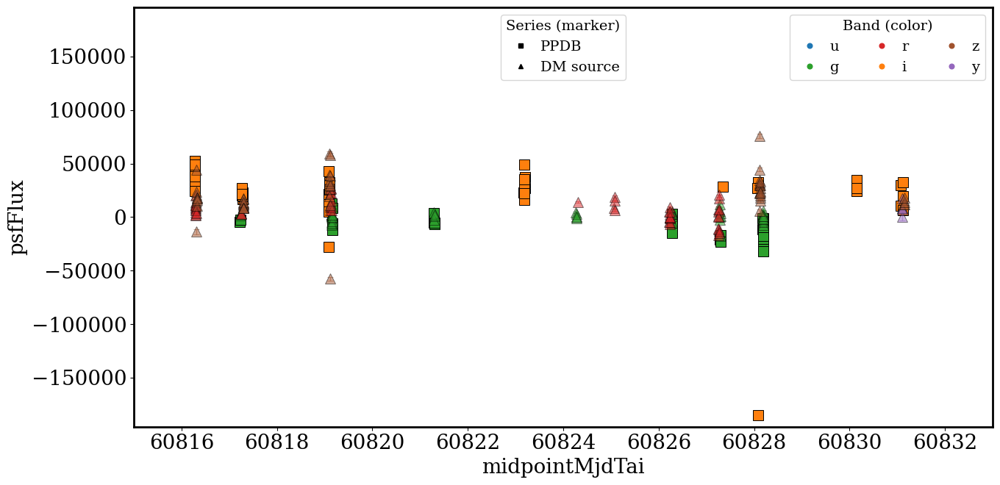

In [25]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np

# --- color map for ugrizy ---
band_colors = {
    "u": "tab:blue",
    "g": "tab:green",
    "r": "tab:red",
    "i": "tab:orange",
    "z": "sienna",      # or "tab:brown"
    "y": "tab:purple",
}

# --- toggle for forced source plotting ---
show_forced = False   # set to False to hide diaObjectForcedSource_dm

# --- which DataFrame uses which marker ---
series = []
if show_forced:
    series.append(("DM forced", single_object.get("diaObjectForcedSource_dm"), "o"))
series.extend([
    ("PPDB",      single_object.get("diaSource_ppdb"), "s"),
    ("DM prompt", single_object.get("diaSource_dm"),   "^"),
])

fig, ax = plt.subplots(figsize=(14, 7))

for label, df, marker in series:
    if df is None:
        continue

    needed = ["midpointMjdTai", "psfFluxErr", "band"]
    flux_col = "psfDiffFlux" if label == "DM forced" else "psfFlux"
    needed = needed + [flux_col]

    if not all(col in df.columns for col in needed):
        continue

    dfx = df.dropna(subset=needed)

    for band in np.unique(dfx["band"].astype(str)):
        color = band_colors.get(band, "0.5")
        sel = dfx["band"].astype(str) == band
        alpha_val = 0.5 if label == "DM prompt" else 1.0

        ax.errorbar(
            dfx.loc[sel, "midpointMjdTai"],
            dfx.loc[sel, flux_col],
            yerr=dfx.loc[sel, "psfFluxErr"],
            fmt=marker,
            ms=10,
            mew=0.7,
            mec="black",
            ecolor=color,
            elinewidth=1,
            capsize=3,
            linestyle="none",
            color=color,
            alpha=alpha_val,
            label=None,
        )

# axis labels
ax.set_xlabel("midpointMjdTai")
ax.set_ylabel("psfFlux")

# --- legends: one for dataset/marker, one for band/color ---
dataset_handles = []
if show_forced:
    dataset_handles.append(Line2D([0], [0], marker="o", linestyle="none", color="k", label="DM forcedSource"))
dataset_handles.extend([
    Line2D([0], [0], marker="s", linestyle="none", color="k", label="PPDB"),
    Line2D([0], [0], marker="^", linestyle="none", color="k", label="DM source"),
])

band_handles = [
    Line2D([0], [0], marker="o", linestyle="none", color=c, label=b)
    for b, c in band_colors.items()
]

leg1 = ax.legend(
    handles=dataset_handles,
    title="Series (marker)",
    loc="upper center",
    fontsize=14,
    title_fontsize=14,
    markerscale=0.8,
    handletextpad=0.4,
    borderaxespad=0.5,
)
ax.add_artist(leg1)

ax.legend(
    handles=band_handles,
    title="Band (color)",
    loc="upper right",
    ncol=3,
    fontsize=14,
    title_fontsize=14,
    markerscale=0.8,
    handletextpad=0.4,
    borderaxespad=0.5,
)

# --- after plotting, set symmetric y-axis limits by percentiles ---
all_vals = []
for label, df, _ in series:
    if df is None:
        continue
    flux_col = "psfDiffFlux" if label == "DM forced" else "psfFlux"
    if flux_col in df.columns:
        vals = df[flux_col].dropna().to_numpy()
        if len(vals) > 0:
            all_vals.append(vals)

if all_vals:
    all_vals = np.concatenate(all_vals)
    lo, hi = np.percentile(all_vals, [2, 98])
    max_abs = max(abs(lo), abs(hi))
    ax.set_ylim(-max_abs - 2500, max_abs + 2500)

# --- set x-axis limits ---
ax.set_xlim(60815, 60833)

plt.tight_layout()
plt.show()

# Distribution 

In [26]:
PPSB_DM_match_many_PPDB['diaObjectForcedSource_dm'].iloc[3000]

,band,coord_dec,coord_ra,diff_PixelFlags_nodataCenter,forcedSourceOnDiaObjectId,invalidPsfFlag,midpointMjdTai,pixelFlags_bad,pixelFlags_cr,pixelFlags_crCenter,pixelFlags_edge,pixelFlags_interpolated,pixelFlags_interpolatedCenter,pixelFlags_nodata,pixelFlags_saturated,pixelFlags_saturatedCenter,pixelFlags_suspect,pixelFlags_suspectCenter,psfDiffFlux,psfDiffFlux_flag,psfDiffFluxErr,psfFlux,psfFlux_flag,psfFluxErr,psfMag,psfMagErr,visit
0,i,-40.169464,226.688203,False,24708265029414502,False,60816.273809,False,False,False,False,False,False,False,False,False,False,False,-916.700195,False,773.035461,380960.65625,False,755.750732,17.447800,0.002154,2025052000296
1,i,-40.169464,226.688203,False,24708265181971394,False,60816.274351,False,False,False,False,False,False,False,False,False,False,False,-1726.402710,False,720.551758,380386.25000,False,704.328674,17.449438,0.002010,2025052000297
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
432,z,-40.169464,226.688203,False,24774220430966881,False,60831.147072,False,False,False,False,False,False,False,False,False,False,False,-2845.535400,False,1137.624023,453183.81250,False,1081.017212,17.259314,0.002590,2025060400182
433,z,-40.169464,226.688203,False,24774220850399170,False,60831.148669,False,False,False,False,False,False,False,False,False,False,False,-2126.539307,False,1037.308594,449657.12500,False,989.688843,17.267796,0.002390,2025060400185


In [29]:
PPSB_DM_match_many_PPDB.to_parquet("PPSB_DM_match_many_PPDB.parquet")

In [42]:
# wont fit in 250 Gb per worker
#PPSB_DM_match.compute().to_parquet("PPSB_DM_match.parquet")

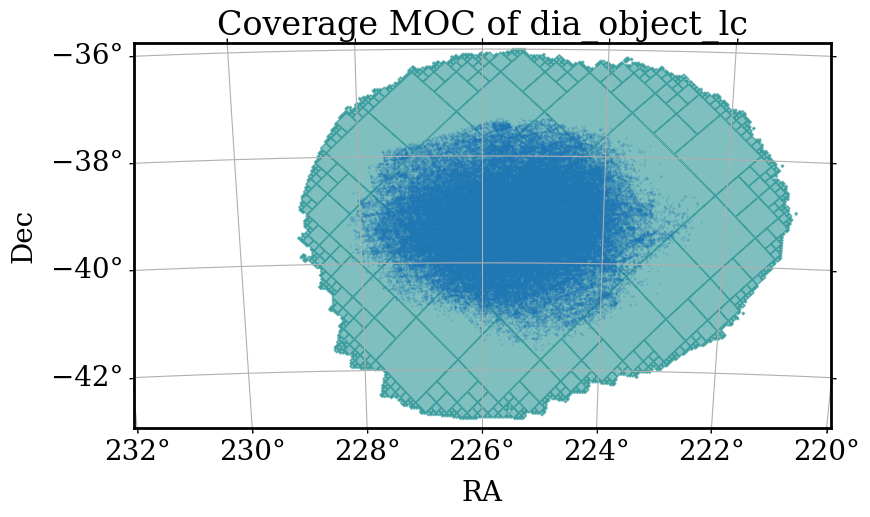

In [56]:
# coverage plot
fig, ax = dia_object_cat_time.plot_coverage(
    fov=(8 * u.deg, 8 * u.deg),
    center=SkyCoord(226 * u.deg, -39.5 * u.deg, frame="icrs")
)

# overlay scatter on the same WCSAxes
ax.scatter(
    PPSB_DM_match_many_PPDB['ra_ppdb'],
    PPSB_DM_match_many_PPDB['dec_ppdb'],
    s=0.2, alpha=0.3,
    transform=ax.get_transform('icrs')  # key: RA/Dec → WCS transform
)

plt.show()

In [63]:
PPSB_DM_match_many_PPDB

diaObjectId_ppdb                validityStart_ppdb  \
_healpix_29                                                                
3002405607410977041  24708265437824225  2025-06-05 03:06:04.927000+00:00   
3002405451961711618  24708266505798528  2025-06-05 03:06:04.927000+00:00   
...                                ...                               ...   
3099745391099992341  24721450476765192  2025-06-05 03:08:41.121000+00:00   
3099752004665518899  24708266842916288  2025-06-05 03:08:41.121000+00:00   

                      dec_ppdb  decErr_ppdb  g_fpFluxMean_ppdb  \
_healpix_29                                                      
3002405607410977041 -41.426667         <NA>               <NA>   
3002405451961711618 -41.457949         <NA>               <NA>   
...                        ...          ...                ...   
3099745391099992341 -37.816049         <NA>               <NA>   
3099752004665518899 -37.709006         <NA>               <NA>   

                     g_fpFluxMeanErr_ppdb  g_fpFluxSigma_ppdb  \
_healpix_29                                                     
3002405607410977041                  <NA>                <NA>   
3002405451961711618                  <NA>                <NA>   
...                                   ...                 ...   
3099745391099992341                  <NA>                <NA>   
3099752004665518899                  <NA>                <NA>   

                     g_psfFluxChi2_ppdb  g_psfFluxErrMean_ppdb  \
_healpix_29                                                      
3002405607410977041                <NA>                   <NA>   
3002405451961711618                <NA>                   <NA>   
...                                 ...                    ...   
3099745391099992341                <NA>                   <NA>   
3099752004665518899                <NA>                   <NA>   

                     g_psfFluxLinearIntercept_ppdb  g_psfFluxLinearSlope_ppdb  \
_healpix_29                                                                     
3002405607410977041                           <NA>                       <NA>   
3002405451961711618                           <NA>                       <NA>   
...                                            ...                        ...   
3099745391099992341                           <NA>                       <NA>   
3099752004665518899                           <NA>                       <NA>   

                     g_psfFluxMAD_ppdb  g_psfFluxMax_ppdb  \
_healpix_29                                                 
3002405607410977041               <NA>               <NA>   
3002405451961711618               <NA>               <NA>   
...                                ...                ...   
3099745391099992341               <NA>               <NA>   
3099752004665518899               <NA>               <NA>   

                     g_psfFluxMaxSlope_ppdb  g_psfFluxMean_ppdb  \
_healpix_29                                                       
3002405607410977041                    <NA>                <NA>   
3002405451961711618                    <NA>                <NA>   
...                                     ...                 ...   
3099745391099992341                    <NA>                <NA>   
3099752004665518899                    <NA>                <NA>   

                     g_psfFluxMeanErr_ppdb  g_psfFluxMin_ppdb  \
_healpix_29                                                     
3002405607410977041                   <NA>               <NA>   
3002405451961711618                   <NA>               <NA>   
...                                    ...                ...   
3099745391099992341                   <NA>               <NA>   
3099752004665518899                   <NA>               <NA>   

                     g_psfFluxNdata_ppdb  g_psfFluxPercentile05_ppdb  \
_healpix_29                                                            
3002405607410977041                    0 

(array([3.2790e+04, 2.7019e+04, 1.9484e+04, 1.3766e+04, 9.6260e+03,
        6.7370e+03, 4.6170e+03, 3.1680e+03, 2.1940e+03, 1.4850e+03,
        9.9900e+02, 5.9100e+02, 3.8700e+02, 2.0800e+02, 1.4500e+02,
        7.2000e+01, 4.1000e+01, 1.4000e+01, 3.0000e+00, 1.0000e+00]),
 array([ 50.,  60.,  70.,  80.,  90., 100., 110., 120., 130., 140., 150.,
        160., 170., 180., 190., 200., 210., 220., 230., 240., 250.]),
 <BarContainer object of 20 artists>)

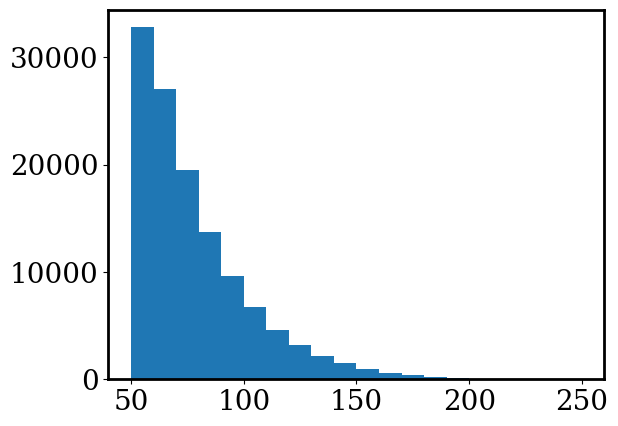

In [70]:
plt.hist(PPSB_DM_match_many_PPDB['nDiaSources_ppdb'],bins=np.arange(50,260,10))

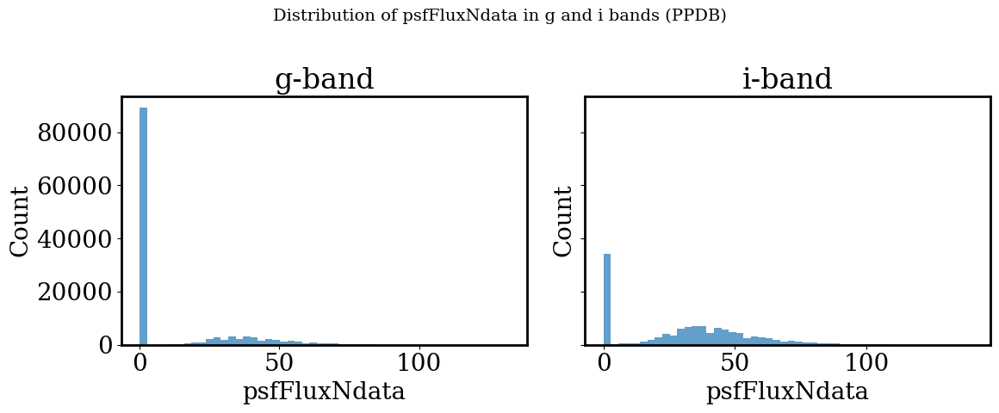

In [75]:
import matplotlib.pyplot as plt

bands = ["g", "i"]

fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

for ax, band in zip(axes, bands):
    col = f"{band}_psfFluxNdata_ppdb"
    ax.hist(PPSB_DM_match_many_PPDB[col], bins=50, alpha=0.7)
    ax.set_title(f"{band}-band")
    ax.set_xlabel("psfFluxNdata")
    ax.set_ylabel("Count")

fig.suptitle("Distribution of psfFluxNdata in g and i bands (PPDB)", fontsize=14)
plt.tight_layout()
plt.show()

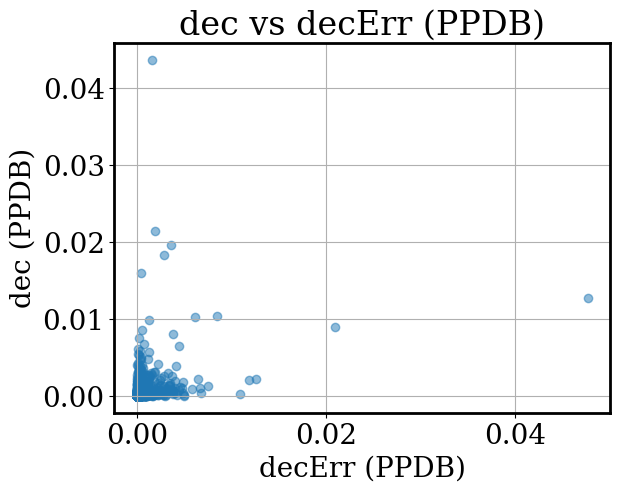

In [79]:
plt.scatter(PPSB_DM_match_many_PPDB['raErr_ppdb'], PPSB_DM_match_many_PPDB['decErr_ppdb'], alpha=0.5)
plt.xlabel("decErr (PPDB)")
plt.ylabel("dec (PPDB)")
plt.title("dec vs decErr (PPDB)")
plt.grid()
plt.show()

In [91]:
# fraction of object with NaN values
print(np.sum(np.isnan(PPSB_DM_match_many_PPDB['decErr_ppdb']))/len(PPSB_DM_match_many_PPDB['decErr_ppdb']))
print(np.sum(np.isnan(PPSB_DM_match_many_PPDB['raErr_ppdb']))/len(PPSB_DM_match_many_PPDB['raErr_ppdb']))

0.3823166974738139
0.3823166974738139


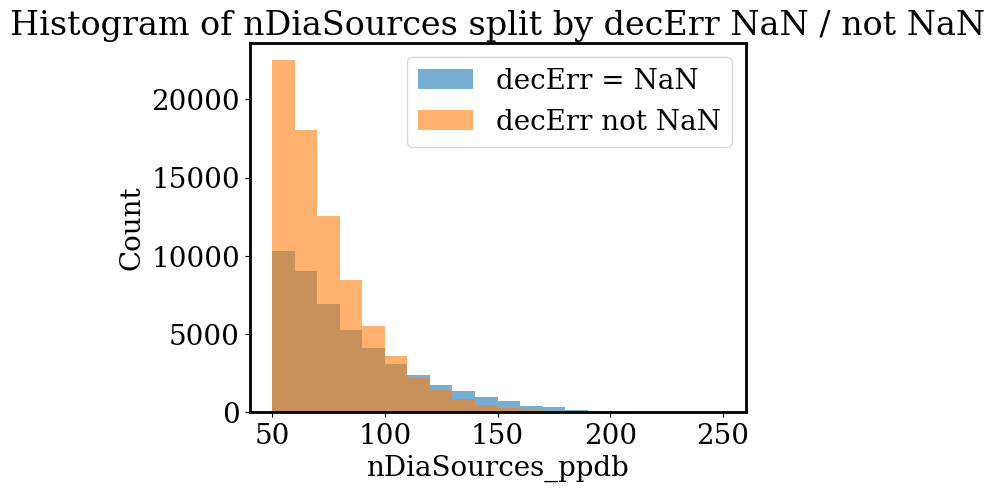

In [92]:
# Mask for NaN vs non-NaN
mask_nan = PPSB_DM_match_many_PPDB['decErr_ppdb'].isna()
mask_notnan = ~mask_nan

# Column to histogram
col = 'nDiaSources_ppdb'
bins = np.arange(50, 260, 10)

plt.hist(
    PPSB_DM_match_many_PPDB.loc[mask_nan, col],
    bins=bins,
    alpha=0.6,
    label="decErr = NaN"
)

plt.hist(
    PPSB_DM_match_many_PPDB.loc[mask_notnan, col],
    bins=bins,
    alpha=0.6,
    label="decErr not NaN"
)

plt.xlabel("nDiaSources_ppdb")
plt.ylabel("Count")
plt.legend()
plt.title("Histogram of nDiaSources split by decErr NaN / not NaN")
plt.show()

In [105]:
object_with_Err = PPSB_DM_match_many_PPDB.loc[3002405517356263518]['diaSource_ppdb']
np.sum(np.isnan(object_with_Err['dec']))

np.int64(0)

In [138]:
PPSB_DM_match_many_PPDB["diaSource_ppdb.visit"]

_healpix_29
3002405607410977041    2025052300212
3002405607410977041    2025052100141
                           ...      
3099752004665518899    2025060100559
3099752004665518899    2025052100151
Name: visit, Length: 9804714, dtype: int64[pyarrow]

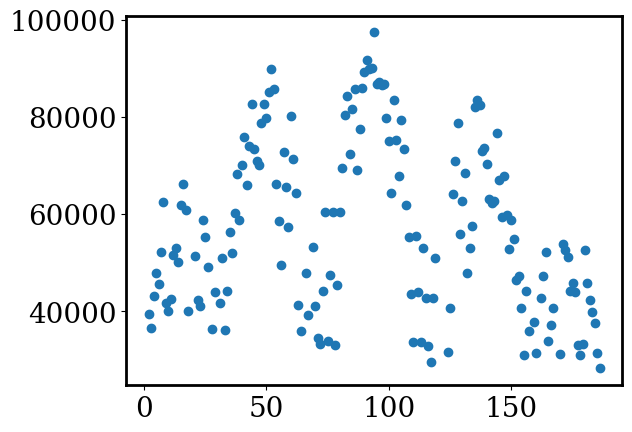

In [137]:
plt.scatter(np.unique(PPSB_DM_match_many_PPDB["diaSource_ppdb.detector"], return_counts=True)[0], np.unique(PPSB_DM_match_many_PPDB["diaSource_ppdb.detector"], return_counts=True)[1])

In [64]:
# Self-contained focal-plane heatmap for LSSTCam
# Plots arbitrary per-detector values (e.g., number of sources).
from __future__ import annotations

from typing import Mapping, Optional, Union

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
from matplotlib.colors import Normalize, LogNorm
from matplotlib.cm import ScalarMappable

from lsst.afw.cameraGeom import FIELD_ANGLE, Camera
from lsst.obs.lsst import LsstCam

def make_focal_plane_map(
    values: Union[Mapping[int, float], "pd.Series"],
    *,
    camera: Optional[Camera] = None,
    vmin: Optional[float] = None,
    vmax: Optional[float] = None,
    cmap: str = "viridis",
    title: str = "",
    save_as: str = "",
    annotate: bool = True,
    show_ids=False,       # <--- new flag
    log_scale: bool = False,
    missing_color: str = "#dddddd",
    edgecolor: str = "gray",
    linewidth: float = 0.5,
    stats_box: bool = True,
):
    """
    Plot per-detector values on the LSSTCam focal plane.

    Parameters
    ----------
    values
        Mapping from detectorId -> value (e.g., number of sources). A pandas Series
        with detectorId index also works.
    camera
        LSST Camera object. Defaults to LsstCam().getCamera().
    vmin, vmax
        Color scaling limits. If None, computed from finite values.
    cmap
        Matplotlib colormap name.
    title
        Figure title.
    save_as
        If non-empty, path where the figure will be saved (e.g., 'focal_map.png').
    annotate
        If True, write the numeric value at the center of each detector.
    log_scale
        If True, use logarithmic color normalization (LogNorm).
    missing_color
        Face color for detectors with no value provided.
    edgecolor
        Polygon edge color.
    linewidth
        Polygon edge linewidth.
    stats_box
        If True, show mean/median/std box.

    Returns
    -------
    fig, ax : matplotlib Figure and Axes
    """
    # Lazy import for optional pandas Series typing
    try:
        import pandas as pd  # noqa: F401
    except Exception:
        pd = None

    # Normalize input to a dict[int, float]
    if hasattr(values, "to_dict"):  # pandas Series or similar
        values = values.to_dict()

    if camera is None:
        camera = LsstCam().getCamera()

    # Collect data arrays in the camera's detector id space
    det_ids = [det.getId() for det in camera]
    data = []
    for det_id in det_ids:
        val = values.get(det_id, np.nan)
        data.append(val)
    data = np.array(data, dtype=float)

    # Determine vmin/vmax from finite data
    finite = np.isfinite(data)
    if vmin is None:
        vmin = np.nanmin(data[finite]) if finite.any() else 0.0
    if vmax is None:
        vmax = np.nanmax(data[finite]) if finite.any() else 1.0
    if vmin == vmax:  # avoid zero range
        vmax = vmin + 1e-6

    norm = LogNorm(vmin=max(vmin, 1e-12), vmax=vmax) if log_scale else Normalize(vmin=vmin, vmax=vmax)
    cmap_obj = get_cmap(cmap)

    fig, ax = plt.subplots(figsize=(10, 10))

    # Draw each detector polygon
    for det_id, val in zip(det_ids, data):
        det = camera.get(det_id)
        corners = det.getCorners(FIELD_ANGLE)
        corners_deg = np.rad2deg(corners)
        x = np.append(corners_deg[:, 0], corners_deg[0, 0])
        y = np.append(corners_deg[:, 1], corners_deg[0, 1])

        color = cmap_obj(norm(val)) if np.isfinite(val) else missing_color
        ax.fill(x, y, facecolor=color, edgecolor=edgecolor, linewidth=linewidth)

        x_c = np.mean(corners_deg[:, 0])
        y_c = np.mean(corners_deg[:, 1])

        # value annotation
        if annotate and np.isfinite(val):
            ax.text(x_c, y_c, f"{val:.0f}",
                    color="white", fontsize=7,
                    ha="center", va="center")

        # detector ID annotation
        if show_ids:
            ax.text(x_c, y_c + 0.01, str(det_id),   # offset a bit down
                    color="black", fontsize=8,
                    ha="center", va="center", alpha=0.8)

    # Stats box (finite values only)
    if stats_box and finite.any():
        vals = data[finite]
        mean_v = float(np.mean(vals))
        median_v = float(np.median(vals))
        std_v = float(np.std(vals))
        stats_txt = f"Mean: {mean_v:.1f}\nMedian: {median_v:.1f}\nStd: {std_v:.1f}\nN det: {finite.sum()}"
        ax.text(
            0.98, 0.98, stats_txt,
            transform=ax.transAxes, fontsize=10, va="top", ha="right",
            bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.85)
        )

    # Colorbar
    sm = ScalarMappable(norm=norm, cmap=cmap_obj)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)  # <-- smaller bar
    cbar.set_label("Value per detector")

    ax.set_xlabel("Field Angle X [deg]")
    ax.set_ylabel("Field Angle Y [deg]")
    ax.set_aspect("equal", adjustable="box")
    ax.grid(True, alpha=0.3)

    if title:
        fig.suptitle(title, fontsize=16)

    fig.tight_layout()

    if save_as:
        fig.savefig(save_as, dpi=150)

    return fig, ax

/lscratch/ncaplar/ipykernel_1653073/399604440.py:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_obj = get_cmap(cmap)


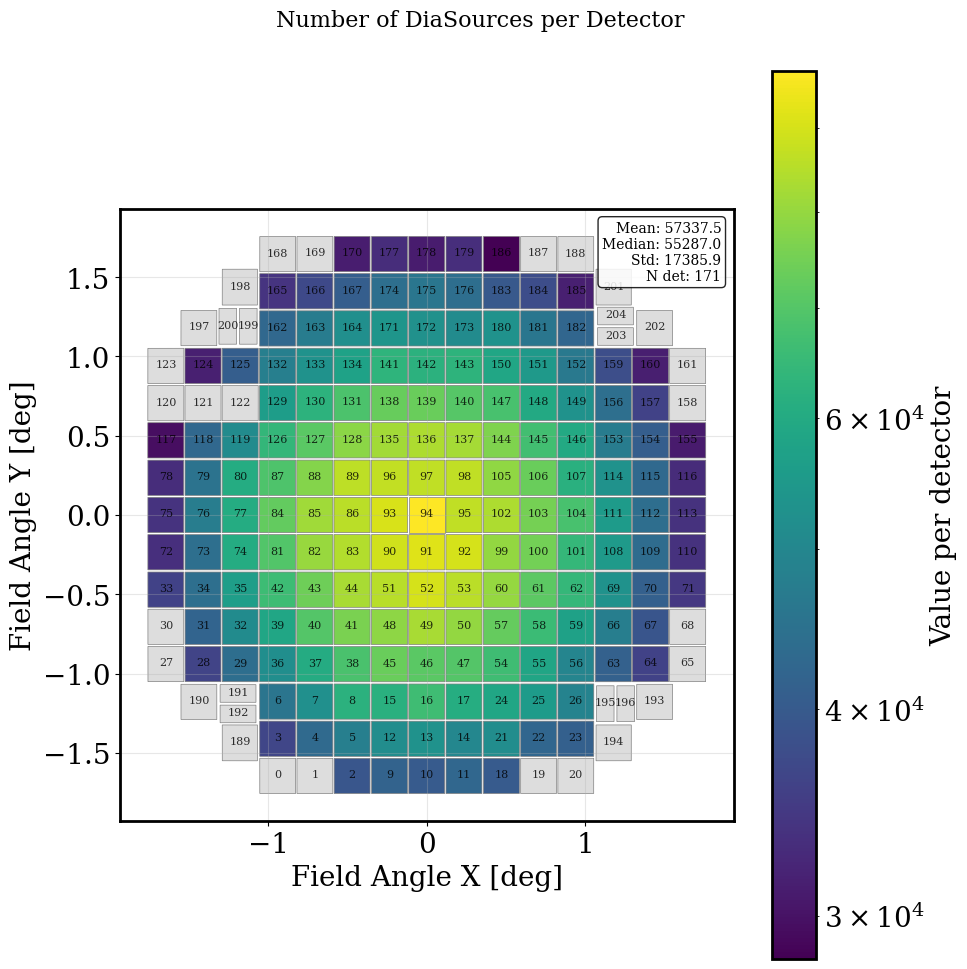

In [169]:
det_ids, counts = np.unique(
    PPSB_DM_match_many_PPDB["diaSource_ppdb.detector"],
    return_counts=True
)


# Build mapping from detectorId -> count
counts_per_det = dict(zip(det_ids, counts))

# Now plot
fig, ax = make_focal_plane_map(
    counts_per_det,
    title="Number of DiaSources per Detector",
    cmap="viridis",
    log_scale=True,
    show_ids=True, # helpful if counts span orders of magnitude
    annotate=False       # True if you want numbers drawn inside detectors
)

plt.show()

In [161]:
df = PPSB_DM_match_many_PPDB

# Collect detector IDs (skip NaNs)
det_series = df['diaSource_ppdb.detector']
detectors = sorted(x for x in pd.unique(det_series) if pd.notna(x))

rows = []
for det in tqdm(detectors):
    det_val = int(det)  # ensure it's a plain int for the f-string
    # IMPORTANT: literal substitution, not @det
    visits = df.query(f'diaSource_ppdb.detector == {det_val}')['diaSource_ppdb.visit']
    n_sources = len(visits)
    n_visits  = visits.nunique()
    avg_spv   = n_sources / n_visits if n_visits else np.nan
    rows.append((int(det), int(n_sources), int(n_visits), float(avg_spv)))

out = pd.DataFrame(rows, columns=['detector', 'n_sources', 'n_visits', 'avg_sources_per_visit']) \
        .sort_values('detector', ignore_index=True)

print(out.head())
# If you want a dict for plotting later:
avg_per_det = dict(zip(out['detector'], out['avg_sources_per_visit']))

100%|██████████| 171/171 [04:37<00:00,  1.62s/it]

   detector  n_sources  n_visits  avg_sources_per_visit
0         2      39364       315             124.965079
1         3      36645       324             113.101852
2         4      43148       349             123.633238
3         5      47937       359             133.529248
4         6      45601       354             128.816384


In [162]:
avg_per_det

{2: 124.96507936507936,
 3: 113.10185185185185,
 4: 123.63323782234957,
 5: 133.52924791086352,
 6: 128.81638418079095,
 7: 140.35752688172042,
 8: 153.71428571428572,
 9: 125.7703927492447,
 10: 128.81993569131834,
 11: 133.86163522012578,
 12: 141.97527472527472,
 13: 143.55945945945945,
 14: 138.19559228650138,
 15: 151.43765281173594,
 16: 157.31353919239905,
 17: 149.04656862745097,
 18: 128.62820512820514,
 21: 144.6067415730337,
 22: 121.74137931034483,
 23: 135.83168316831683,
 24: 144.85221674876848,
 25: 143.76363636363635,
 26: 137.46778711484595,
 28: 117.77922077922078,
 29: 123.04189944134079,
 31: 122.9235294117647,
 32: 129.6412213740458,
 33: 122.81972789115646,
 34: 125.41076487252124,
 35: 135.30528846153845,
 36: 135.61096605744126,
 37: 143.3190476190476,
 38: 156.24027459954235,
 39: 140.00714285714287,
 40: 154.01978021978022,
 41: 165.11111111111111,
 42: 147.74049217002238,
 43: 158.56531049250535,
 44: 171.71576763485479,
 45: 159.77124183006535,
 46: 154.7860

/lscratch/ncaplar/ipykernel_1653073/3586867970.py:99: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_obj = get_cmap(cmap)


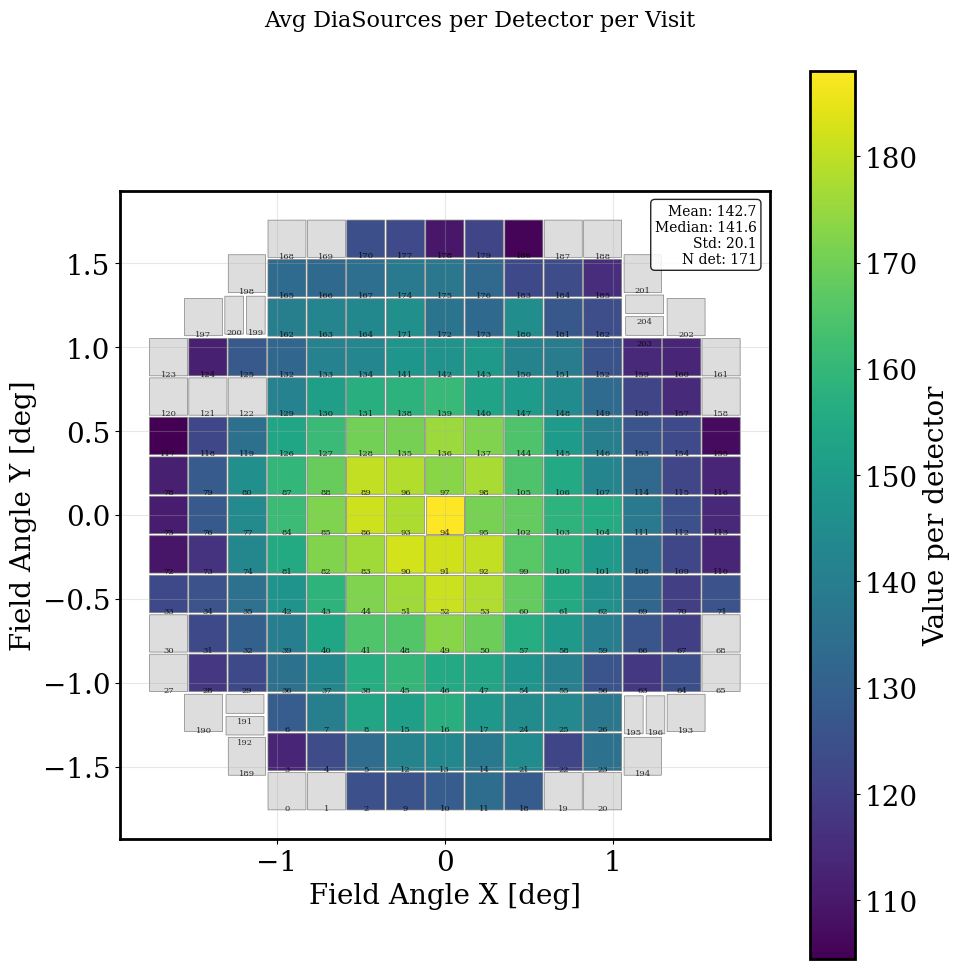

In [163]:
# avg_per_det is your dict: {detector_id -> avg_sources_per_visit}
fig, ax = make_focal_plane_map(
    avg_per_det,
    title="Avg DiaSources per Detector per Visit",
    cmap="viridis",
    log_scale=False,   # averages usually OK linear; flip True if skewed
    annotate=False,    # set True to print the average number inside each detector
    show_ids=True      # also label detector IDs
)
plt.show()

In [ ]:
single_detector_data = PPSB_DM_match_many_PPDB.query('diaSource_ppdb.detector == 2')['diaSource_ppdb.visit']
len(single_detector_data)/len(np.unique(single_detector_data))

  0%|          | 0/171 [00:00<?, ?it/s]


ValueError: Queries cannot target multiple structs/layers, write a separate query for each

In [175]:
dia_object_cat['diaSource'].nest.fields

['band',
 'centroid_flag',
 'coord_dec',
 'coord_ra',
 'dec',
 'decErr',
 'diaSourceId',
 'forced_PsfFlux_flag',
 'forced_PsfFlux_flag_edge',
 'forced_PsfFlux_flag_noGoodPixels',
 'midpointMjdTai',
 'pixelFlags',
 'pixelFlags_bad',
 'pixelFlags_cr',
 'pixelFlags_crCenter',
 'pixelFlags_edge',
 'pixelFlags_interpolated',
 'pixelFlags_interpolatedCenter',
 'pixelFlags_nodata',
 'pixelFlags_nodataCenter',
 'pixelFlags_offimage',
 'pixelFlags_saturated',
 'pixelFlags_saturatedCenter',
 'pixelFlags_streak',
 'pixelFlags_streakCenter',
 'pixelFlags_suspect',
 'pixelFlags_suspectCenter',
 'psfFlux',
 'psfFlux_flag',
 'psfFlux_flag_edge',
 'psfFlux_flag_noGoodPixels',
 'psfFluxErr',
 'psfMag',
 'psfMagErr',
 'ra',
 'raErr',
 'reliability',
 'scienceFlux',
 'scienceFluxErr',
 'scienceMag',
 'scienceMagErr',
 'shape_flag',
 'shape_flag_no_pixels',
 'shape_flag_not_contained',
 'shape_flag_parent_source',
 'snr',
 'trail_flag_edge',
 'visit',
 'x',
 'xErr',
 'y',
 'yErr']

# Full PPDB per detector analysis 

In [2]:
import os
print(os.getcwd())

/sdf/home/n/ncaplar


In [3]:
client = Client(n_workers=85, memory_limit="250GiB", threads_per_worker=2)
# Print the dashboard link and port
print(f"Dask is running at: {client.dashboard_link}")

Dask is running at: http://127.0.0.1:8787/status


In [5]:
# PPDB - load the small portion
hats_dir_ppdb = Path("/sdf/data/rubin/shared/lsdb_commissioning/hats/PPDB")
cone_search = ConeSearch(ra=220, dec=-40, radius_arcsec=7 * 3600)

dia_object_cat_PPDB = lsdb.open_catalog(hats_dir_ppdb / "diaobject_cat_test", search_filter=cone_search, columns=["diaObjectId", "ra", "dec"])
dia_source_cat_PPDB = lsdb.open_catalog(hats_dir_ppdb / "diasource_cat_test", search_filter=cone_search, columns = ["diaObjectId", 'diaSourceId', 'ssObjectId', 
                                                                                                               'midpointMjdTai', "ra", "dec"])
dia_object_cat_nested_PPDB = lsdb.open_catalog(hats_dir_ppdb / "dia_object_lc", search_filter=cone_search, columns = ["diaObjectId", "ra", "dec", "diaSource.detector"])

In [5]:
for det in tqdm(range(0, 204)):
    det_val = int(det) 
    single_detector_PPDB = dia_object_cat_nested_PPDB.query(f'diaSource.detector == {det_val}')
    single_detector_PPDB_computed = single_detector_PPDB.compute()
    single_detector_PPDB_computed.to_parquet(f'/sdf/data/rubin/shared/lsdb_commissioning/hats/PPDB/ppdb_det/single_detector_PPDB_{det_val}.parquet')


  0%|          | 0/204 [00:00<?, ?it/s]

100%|██████████| 204/204 [30:39<00:00,  9.02s/it]


In [ ]:
for det in tqdm(range(0, 204)):
    det_val = int(det) 
    single_detector_PPDB_computed.load_parquet(f'/sdf/data/rubin/shared/lsdb_commissioning/hats/PPDB/ppdb_det/single_detector_PPDB_{det_val}.parquet')


In [29]:
single_detector_PPDB_computed = npd.read_parquet(f'/sdf/data/rubin/shared/lsdb_commissioning/hats/PPDB/ppdb_det/single_detector_PPDB_{2}.parquet')

In [ ]:
from nested_pandas.utils import count_nested

single_detector_PPDB_computed = npd.read_parquet(f'/sdf/data/rubin/shared/lsdb_commissioning/hats/PPDB/ppdb_det/single_detector_PPDB_{2}.parquet')
single_detector_PPDB_computed_with_count = count_nested(single_detector_PPDB_computed, 'diaSource')
np.sum(single_detector_PPDB_computed_with_count['n_diaSource'])

In [57]:

base = Path("/sdf/data/rubin/shared/lsdb_commissioning/hats/PPDB/ppdb_det")

det_counts = {}
for det in tqdm(range(0, 205)):
    f = base / f"single_detector_PPDB_{det}.parquet"
    if not f.exists():
        continue  # skip detectors without file

    df = npd.read_parquet(f)
    df_with_count = count_nested(df, 'diaSource')
    det_counts[det] = int(np.sum(df_with_count['n_diaSource']))

# now det_counts is {detector_id: total number of detections}
print(list(det_counts.items())[:10])  # peek at first few

100%|██████████| 205/205 [01:00<00:00,  3.38it/s]

[(0, 0), (1, 0), (2, 177703), (3, 186412), (4, 193506), (5, 194436), (6, 205042), (7, 212038), (8, 224475), (9, 183860)]


In [58]:
det_counts

{0: 0,
 1: 0,
 2: 177703,
 3: 186412,
 4: 193506,
 5: 194436,
 6: 205042,
 7: 212038,
 8: 224475,
 9: 183860,
 10: 175763,
 11: 190308,
 12: 204044,
 13: 211047,
 14: 205333,
 15: 214859,
 16: 233960,
 17: 223260,
 18: 188540,
 19: 0,
 20: 0,
 21: 213561,
 22: 194940,
 23: 202664,
 24: 230842,
 25: 231036,
 26: 233785,
 27: 0,
 28: 209448,
 29: 213481,
 30: 0,
 31: 216808,
 32: 229666,
 33: 204831,
 34: 225812,
 35: 236950,
 36: 222218,
 37: 227967,
 38: 231598,
 39: 240418,
 40: 245556,
 41: 254293,
 42: 255099,
 43: 266779,
 44: 264216,
 45: 245858,
 46: 239851,
 47: 247164,
 48: 255412,
 49: 259709,
 50: 256510,
 51: 263184,
 52: 261429,
 53: 258589,
 54: 249763,
 55: 243870,
 56: 241019,
 57: 261500,
 58: 254036,
 59: 242124,
 60: 255638,
 61: 253485,
 62: 257505,
 63: 229669,
 64: 218723,
 65: 0,
 66: 243319,
 67: 234346,
 68: 0,
 69: 249638,
 70: 240169,
 71: 226458,
 72: 205082,
 73: 221136,
 74: 253410,
 75: 209185,
 76: 233901,
 77: 253162,
 78: 206173,
 79: 224286,
 80: 25555

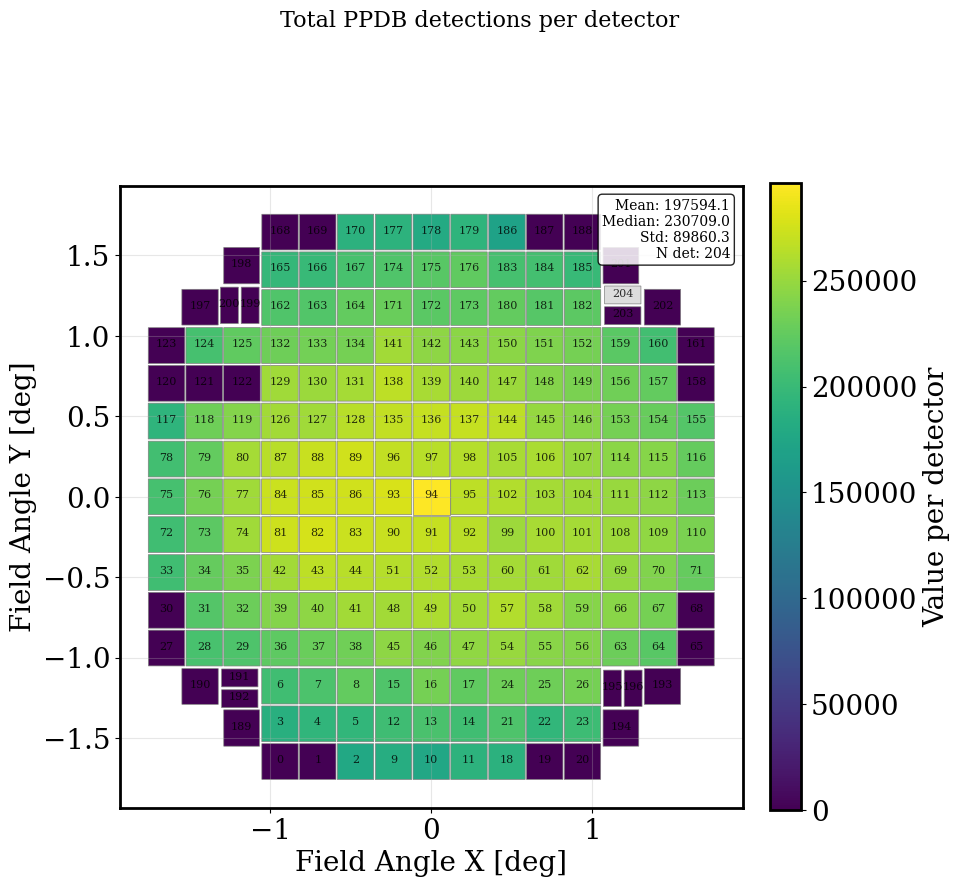

In [69]:
fig, ax = make_focal_plane_map(
    det_counts,
    title="Total PPDB detections per detector",
    annotate=False,
    show_ids=True
)
fig.tight_layout(rect=[0,20, 1, 0.96])
plt.show()

# Translating query

In [ ]:
# PPDB - load the small portion
hats_dir_ppdb = Path("/sdf/data/rubin/shared/lsdb_commissioning/hats/PPDB")
cone_search = ConeSearch(ra=220, dec=-40, radius_arcsec=7 * 3600)

dia_object_cat_PPDB = lsdb.open_catalog(hats_dir_ppdb / "diaobject_cat_test", search_filter=cone_search, columns=["diaObjectId", "ra", "dec"])
dia_source_cat_PPDB = lsdb.open_catalog(hats_dir_ppdb / "diasource_cat_test", search_filter=cone_search, columns = ["diaObjectId", 'diaSourceId', 'ssObjectId', 
                                                                                                               'midpointMjdTai', "ra", "dec"])
dia_object_cat_nested_PPDB = lsdb.open_catalog(hats_dir_ppdb / "dia_object_lc", search_filter=cone_search, columns = ["diaObjectId", "ra", "dec", "diaSource.detector"])

In [ ]:

import lsdb

hats_dir_ppdb = Path("/sdf/data/rubin/shared/lsdb_commissioning/hats/PPDB")

# ADQL center and radius:
ra0, dec0 = 225.5, 7.0
radius_deg = 0.02                         # 0.02 deg
radius_arcsec = radius_deg * 3600         # = 72"

# Open the PPDB DiaObject catalog with a spatial filter
dia_object_cat_nested_PPDB = lsdb.open_catalog(
    hats_dir_ppdb / "dia_object_lc",            # adjust to your catalog path
    columns=["diaObjectId", "ra", "dec"],
    search_filter=lsdb.ConeSearch(ra=ra0, dec=dec0, radius_arcsec=radius_arcsec),
)

# Pull results (dask -> pandas) if you want a DataFrame
df = dia_object_cat_nested_PPDB.compute()        # contains diaObjectId, ra, dec

In [ ]:
# install LSDB if needed
# %pip install lsdb 
import lsdb
from dask.distributed import Client


client = Client(n_workers=4, memory_limit="25GiB", threads_per_worker=2)
# Print the dashboard link and port
print(f"Dask is running at: {client.dashboard_link}")

hats_dir_ppdb = Path("/sdf/data/rubin/shared/lsdb_commissioning/hats/PPDB")

# ADQL center and radius:
ra0, dec0 = 186.8, 7.0
radius_deg = 0.02                         # 0.02 deg
radius_arcsec = radius_deg * 3600         # = 72"

# Open the PPDB DiaObject catalog with a spatial filter
dia_object_cat_nested_PPDB = lsdb.open_catalog(
    hats_dir_ppdb / "dia_object_lc",            # adjust to your catalog path
    columns=["diaObjectId", "ra", "dec"],
    search_filter=lsdb.ConeSearch(ra=ra0, dec=dec0, radius_arcsec=radius_arcsec),
)

# Pull results (dask -> pandas) if you want a DataFrame
df = dia_object_cat_nested_PPDB.compute() 
df

/sdf/home/n/ncaplar/.local/lib/python3.12/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 31153 instead
  warnings.warn(
INFO:distributed.scheduler:State start


INFO:distributed.scheduler:  Scheduler at:     tcp://127.0.0.1:21239
INFO:distributed.scheduler:  dashboard at:  http://127.0.0.1:31153/status
INFO:distributed.scheduler:Registering Worker plugin shuffle
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:19275'
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:14617'
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:7049'
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:26441'
INFO:distributed.scheduler:Register worker addr: tcp://127.0.0.1:1891 name: 2
INFO:distributed.scheduler:Starting worker compute stream, tcp://127.0.0.1:1891
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:57342
INFO:distributed.scheduler:Register worker addr: tcp://127.0.0.1:11133 name: 3
INFO:distributed.scheduler:Starting worker compute stream, tcp://127.0.0.1:11133
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:57348
INFO:distributed.scheduler:Register w

Dask is running at: http://127.0.0.1:31153/status


ValueError: The selected sky region has no coverage

# Overdense region

In [17]:
# install LSDB if needed
# %pip install lsdb 
import lsdb
from dask.distributed import Client
from pathlib import Path

client = Client(n_workers=4, memory_limit="25GiB", threads_per_worker=2)
# Print the dashboard link and port
print(f"Dask is running at: {client.dashboard_link}")

hats_dir_ppdb = Path("/sdf/data/rubin/shared/lsdb_commissioning/hats/PPDB")

# ADQL center and radius:
ra0, dec0 = 225.5, -37.5
radius_deg = 10                   # 0.02 deg
radius_arcsec = radius_deg * 3600         # = 72"


# Open the PPDB DiaObject catalog with a spatial filter
dia_object_cat_nested_PPDB_full = lsdb.open_catalog(
    hats_dir_ppdb / "dia_object_lc",            # adjust to your catalog path
    columns=["diaObjectId", "ra", "dec"],
)

# Pull results (dask -> pandas) if you want a DataFrame
df_full = dia_object_cat_nested_PPDB_full.compute() 


# Open the PPDB DiaObject catalog with a spatial filter
dia_object_cat_nested_PPDB = lsdb.open_catalog(
    hats_dir_ppdb / "dia_object_lc",            # adjust to your catalog path
    columns=["diaObjectId", "ra", "dec"],
    search_filter=lsdb.ConeSearch(ra=ra0, dec=dec0, radius_arcsec=radius_arcsec),
)

# Pull results (dask -> pandas) if you want a DataFrame
df = dia_object_cat_nested_PPDB.compute() 
df

Dask is running at: http://127.0.0.1:10933/status


,diaObjectId,ra,dec
_healpix_29,,,
2954361321270660734,24708265439920132,224.989886,-41.846517
2954361277123214258,24708265439920133,224.981165,-41.845701
...,...,...,...
3100764715665831248,24958945708212825,221.956009,-38.165154
3100744417712818248,24958945708212929,222.071809,-38.099452


ERROR:asyncio:Task exception was never retrieved
future: <Task finished name='Task-5749852' coro=<Client._gather.<locals>.wait() done, defined at /sdf/home/n/ncaplar/.local/lib/python3.12/site-packages/distributed/client.py:2394> exception=AllExit()>
Traceback (most recent call last):
  File "/sdf/home/n/ncaplar/.local/lib/python3.12/site-packages/distributed/client.py", line 2403, in wait
    raise AllExit()
distributed.client.AllExit


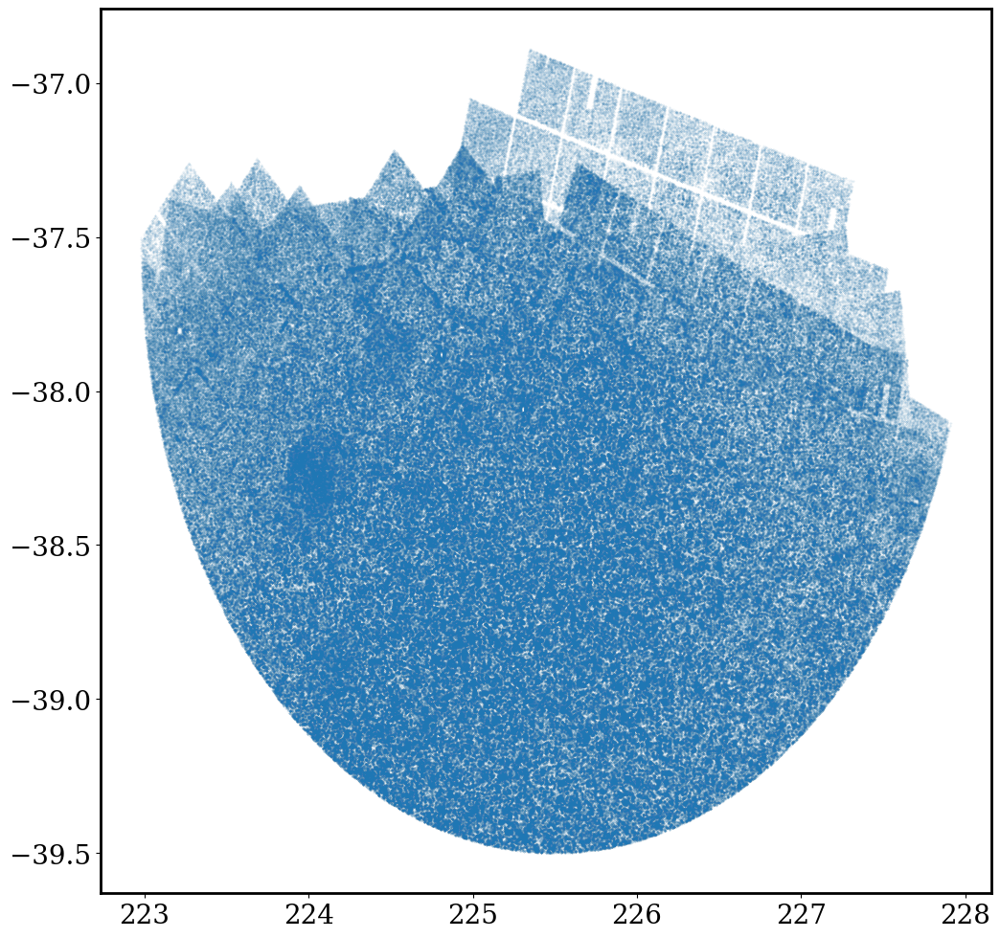

In [14]:
plt.figure(figsize=(12,12))
plt.scatter(df['ra'], df['dec'], s=0.1, alpha = 0.1)

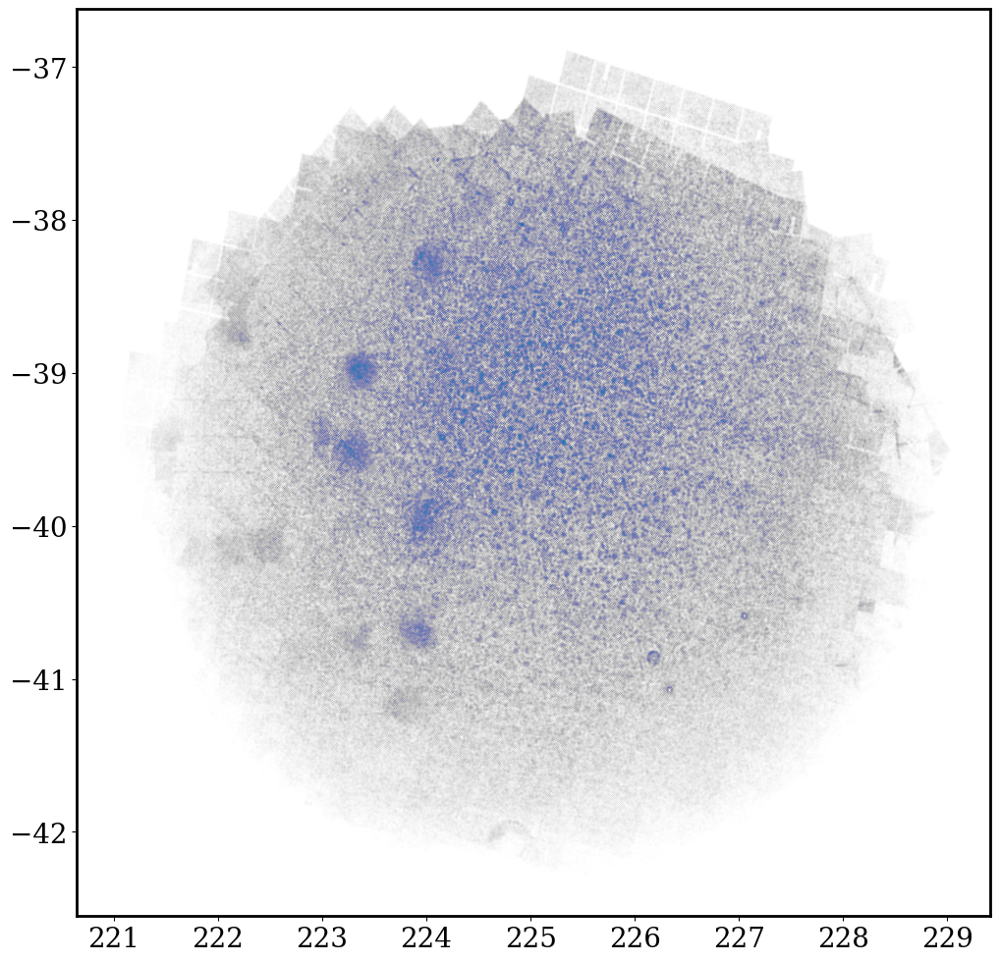

In [42]:
plt.figure(figsize=(12,12))
plt.scatter(df['ra'], df['dec'], s=0.001, alpha = .1)


(-41.04, -41.1)

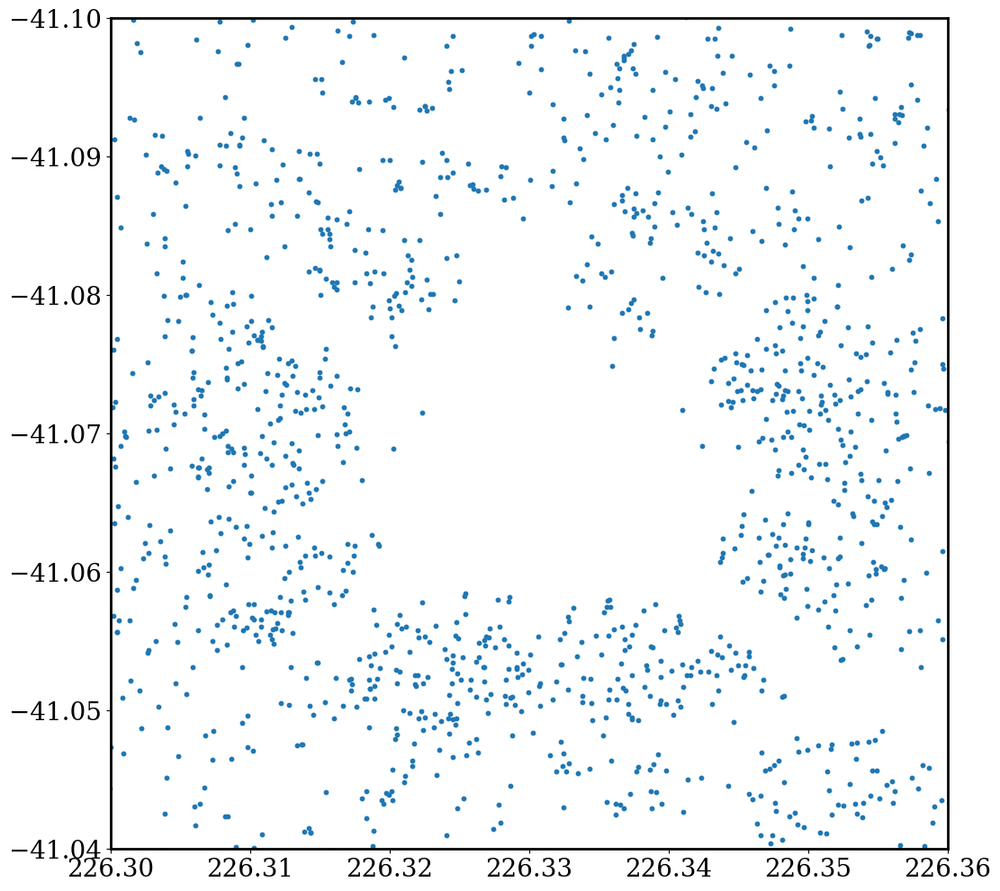

In [40]:
plt.figure(figsize=(12,12))
plt.scatter(df['ra'], df['dec'], s=10, alpha = 1)
plt.xlim(226.3, 226.36)        # instead of plt.xrange
plt.ylim(-41.04, -41.1)        # instead of plt.yrange

(-38.8, -39.2)

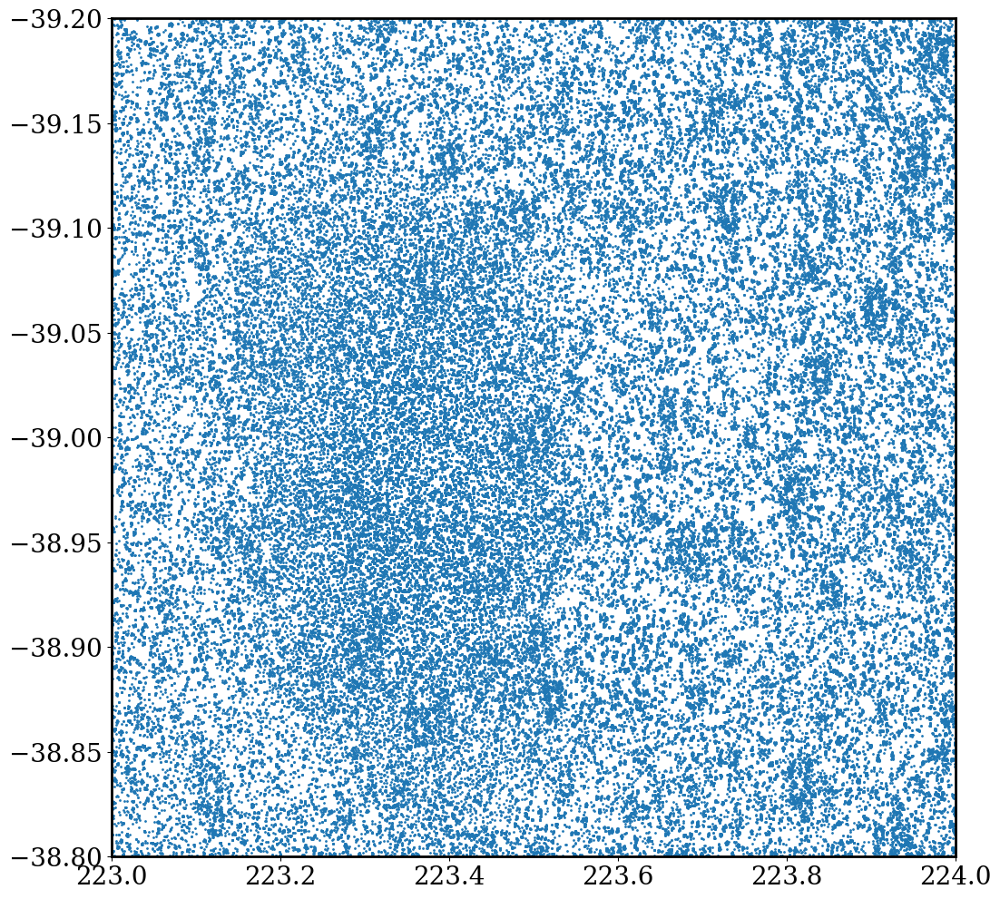

In [48]:
plt.figure(figsize=(12,12))
plt.scatter(df['ra'], df['dec'], s=1, alpha = 1)
plt.xlim(223, 224)        # instead of plt.xrange
plt.ylim(-38.8, -39.2)        # instead of plt.yrange

# Rest

In [3]:
import nested_pandas as npd

In [83]:
dia_object_cat_nested_PPDB['diaSource'].nest.fields

['diaSourceId',
 'apFlux',
 'apFluxErr',
 'apFlux_flag',
 'apFlux_flag_apertureTruncated',
 'band',
 'bboxSize',
 'centroid_flag',
 'dec',
 'decErr',
 'detector',
 'dipoleAngle',
 'dipoleAngleErr',
 'dipoleChi2',
 'dipoleDec',
 'dipoleDecErr',
 'dipoleDec_dipoleAngle_Cov',
 'dipoleDec_dipoleLength_Cov',
 'dipoleFitAttempted',
 'dipoleFluxDiff',
 'dipoleFluxDiffErr',
 'dipoleFluxDiff_dipoleAngle_Cov',
 'dipoleFluxDiff_dipoleDec_Cov',
 'dipoleFluxDiff_dipoleLength_Cov',
 'dipoleFluxDiff_dipoleRa_Cov',
 'dipoleLength',
 'dipoleLengthErr',
 'dipoleLength_dipoleAngle_Cov',
 'dipoleLnL',
 'dipoleMeanFlux',
 'dipoleMeanFluxErr',
 'dipoleMeanFlux_dipoleAngle_Cov',
 'dipoleMeanFlux_dipoleDec_Cov',
 'dipoleMeanFlux_dipoleFluxDiff_Cov',
 'dipoleMeanFlux_dipoleLength_Cov',
 'dipoleMeanFlux_dipoleRa_Cov',
 'dipoleNdata',
 'dipoleRa',
 'dipoleRaErr',
 'dipoleRa_dipoleAngle_Cov',
 'dipoleRa_dipoleDec_Cov',
 'dipoleRa_dipoleLength_Cov',
 'extendedness',
 'forced_PsfFlux_flag',
 'forced_PsfFlux_flag_ed

In [7]:
# PPDB - load the small portion
hats_dir_ppdb = Path("/sdf/data/rubin/shared/lsdb_commissioning/hats/PPDB")
cone_search = ConeSearch(ra=220, dec=-40, radius_arcsec=7 * 3600)

dia_object_cat_PPDB = lsdb.open_catalog(hats_dir_ppdb / "diaobject_cat_test", search_filter=cone_search, columns=["diaObjectId", "ra", "dec"])
dia_source_cat_PPDB = lsdb.open_catalog(hats_dir_ppdb / "diasource_cat_test", search_filter=cone_search, columns = ["diaObjectId", 'diaSourceId', 'ssObjectId', 
                                                                                                               'midpointMjdTai', "ra", "dec"])
dia_object_cat_nested_PPDB = lsdb.open_catalog(hats_dir_ppdb / "dia_object_lc", search_filter=cone_search, columns=["diaObjectId", "ra", "dec", "diaSource"])

In [71]:
ixx = dia_object_cat_nested_PPDB['diaSource.ixx'].compute()
iyy = dia_object_cat_nested_PPDB['diaSource.iyy'].compute()
ixy = dia_object_cat_nested_PPDB['diaSource.ixy'].compute()

In [84]:
ixxPsf = dia_object_cat_nested_PPDB['diaSource.ixxPSF'].compute()
iyyPsf = dia_object_cat_nested_PPDB['diaSource.iyyPSF'].compute()
ixyPsf = dia_object_cat_nested_PPDB['diaSource.ixyPSF'].compute()

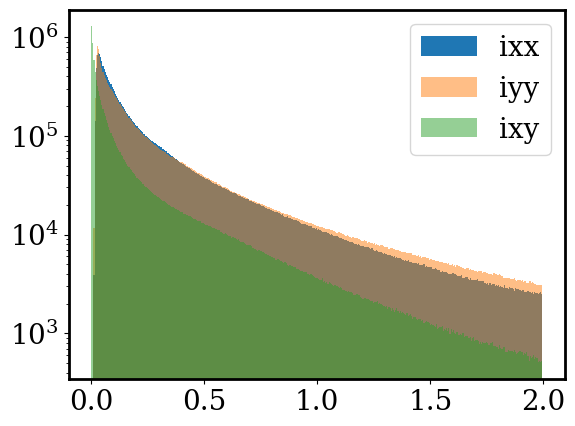

In [82]:
plt.hist(ixx, np.arange(0,2,0.005), label = 'ixx');
plt.hist(iyy, np.arange(0,2,0.005), label = 'iyy', alpha=0.5);
plt.hist(ixy, np.arange(0,2,0.005), label = 'ixy', alpha=0.5);
plt.yscale('log')
plt.legend()

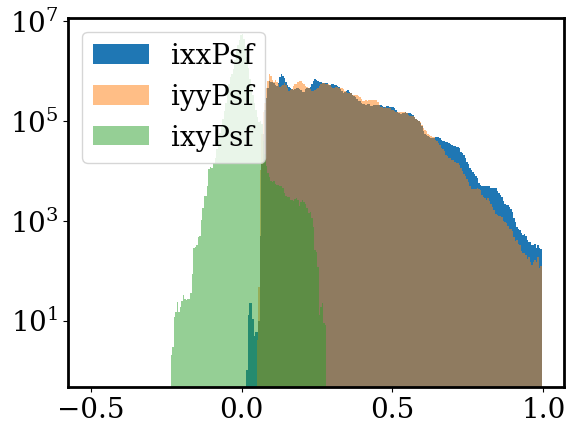

In [88]:
plt.hist(ixxPsf, np.arange(0,1,0.005), label = 'ixxPsf');
plt.hist(iyyPsf, np.arange(0,1,0.005), label = 'iyyPsf', alpha=0.5);
plt.hist(ixyPsf, np.arange(-0.5,1,0.005), label = 'ixyPsf', alpha=0.5);
plt.yscale('log')
plt.legend()

In [8]:
x = dia_object_cat_nested_PPDB['diaSource.x'].compute()
y = dia_object_cat_nested_PPDB['diaSource.y'].compute()

In [15]:
len(x)/100000

403.09197

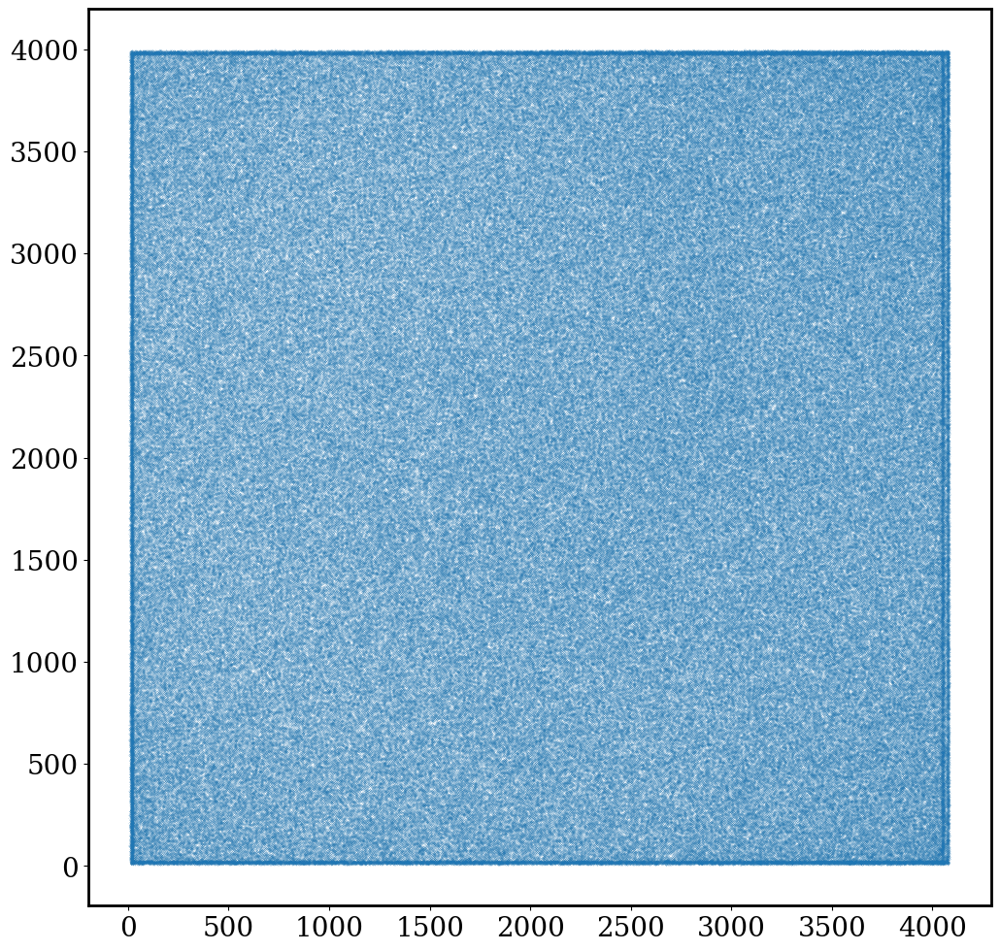

In [16]:
plt.figure(figsize=(12,12))
plt.scatter(x[0:1000000], y[0:1000000],s=0.01)

In [6]:
cone_search = ConeSearch(ra=220, dec=-40, radius_arcsec=2 * 3600)
dia_object_cat = lsdb.open_catalog(hats_dir_dm / "dia_object_collection", search_filter=cone_search, columns=["diaObjectId", "ra", "dec", 'diaSource'])

In [7]:
x = dia_object_cat['diaSource.x'].compute()
y = dia_object_cat['diaSource.y'].compute()

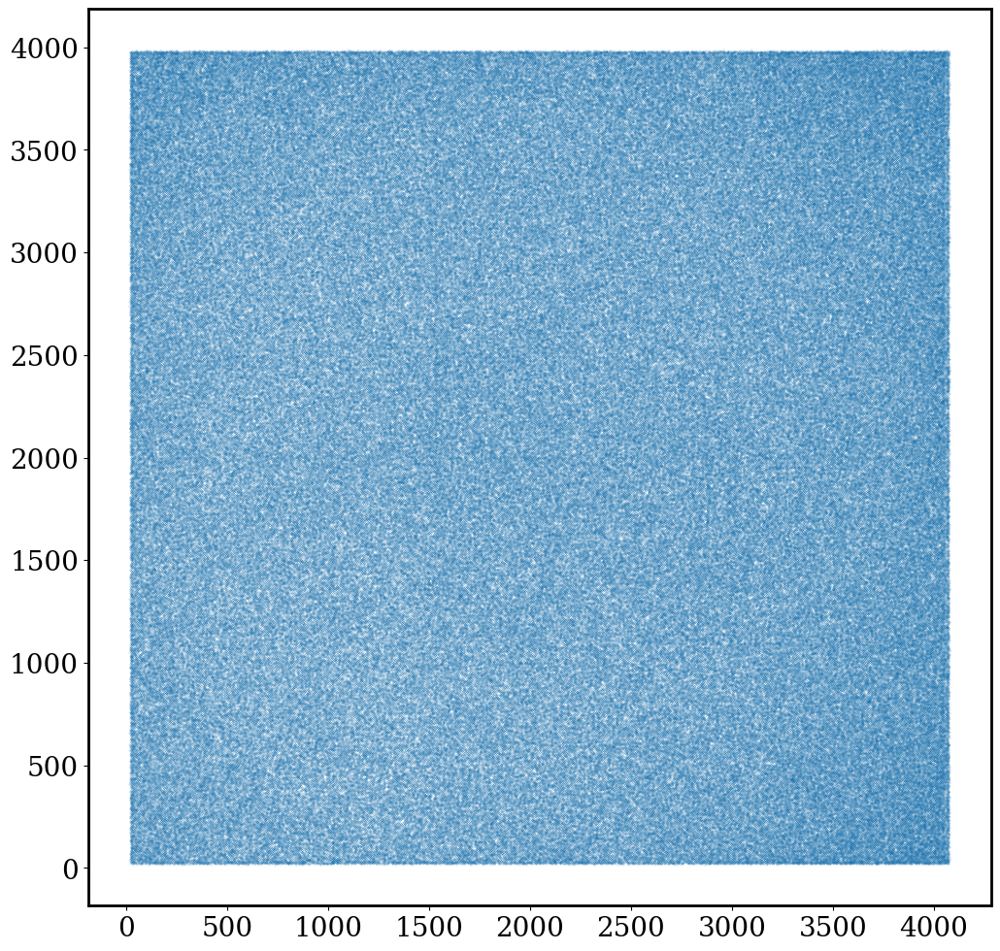

In [8]:
plt.figure(figsize=(12,12))
plt.scatter(x[0:1000000], y[0:1000000],s=0.01)